# Intro

My name is Michael Vigdorchik (314980574), computer science student who is interested in the abundant world of data science and deep learning.

In this semester I decided to participate in the data science workshop course and seize the opprotunity to learn this topic by hands on experience approach.
Along the course I planned to build my final project on the topic of medicine.
While searching Kaggle, I encountered many datasets that refer to medical conditions but out all that I have seen, I chose the Diabetic Retinopathy Dataset for my project.

Diabetic Retinopathy is an eye disease that leads to blindness, and is most common amongst people with diabetes.
Diabetic retinopathy is a condition that occurs with changes in the blood 
vessels of the retina. There are two stages of diabetic retinopathy:

*   **Nonproliferative retinopathy** is the early stage of the disease in which blood vessels swell and leak. This causes macular edema (swelling of the retina) which may result in mild vision loss.
*   **Proliferative retinopathy** is the advanced stage where abnormal new blood vessels grow on the surface of the retina. These vessels may break and bleed into the vitreous, the clear watery gel that fills the eye, and cause severe vision loss.

Anyone with diabetes is at risk for diabetic retinopathy. The longer you have diabetes, the more likely you are to develop diabetic retinopathy.<br />
Your risk rises if you have diabetes and you also smoke, have high blood pressure, or are pregnant.

More information on the condition can be found here: https://www.hopkinsmedicine.org/health/conditions-and-diseases/diabetes/diabetic-retinopathy
<br />
<br />
# The Problem and Motivation
While manually examining this dataset of images , I realized that I would want to construct a neural network that would attempt to diagnose the severity of the condition according to some essential features of the disease that may be present in the image of the eye ball.<br />
Then calssify the condition to the most likely severity.<br />
The severity is categorized to 5 labels:
0.   Healthy (Not DR)
1.   Mild DR
2.   Moderate DR
3.   Proliferative DR
4.   Severe DR
*DR: Diabetic Retinopathy*

After reading further about the condition, and inspecting the images, (from a computer science student without any medical knowledge obviously) I concluded that it will be a challenging task to diagnose a mild or even a moderate phase of the condition.

According to Wikipedia: Diabetic retinopathy affects up to 80 percent of those who have had diabetes for 20 years or more.<br /> 
At least 90% of new cases could be reduced with proper treatment and monitoring of the eyes ...
Each year in the United States, diabetic retinopathy accounts for 12% of all new cases of blindness.<br />
It is also the leading cause of blindness in people aged 20 to 64.

This gave me more motivation to fulfill my project on this topic and attempt to lay the foundation of a Convolutional Neural Network model to function as a diagnosis tool.

The dataset consists of color images of left,right eye pairs. Each pair of images represents a case of DR. (One of the 5 cases mentioned above).
<br />
<br />
# Structure of the Dataset
The structure of the dataset is quite simple.

*   It consists a total of two directories that have the same images.<br />
Both about 35K images of left and right eye images.
*   One directory is the original dataset, and the second one is the resized and cropped version of the dataset.
**The most important difference is that the second directory images have better detail resolution than the other one*.<br /> Hence, we will focus on the better one.
*   An additional csv document is categorizes each image to its DR condition severity score 0 to 4.
*   Each image if of size:  1024 x something RGB pixels in a JPEG format.
*   The kaggle community have filtered out many images that were unsusable, thus the names of the images may reach till 44k.
<br />

Link to dataset: https://www.kaggle.com/datasets/tanlikesmath/diabetic-retinopathy-resized
<br />


### Almost all the project will be done within the Google Colab environment with preinstalled packages/libraries such as Keras, CV2, ...

# Download the Dataset to Google Colab

In [ ]:
! pip install kaggle

In [1]:
! mkdir ~/.kaggle

In [2]:
! cp kaggle.json ~/.kaggle/

In [3]:
! chmod 600 ~/.kaggle/kaggle.json

In [4]:
! kaggle datasets download -d tanlikesmath/diabetic-retinopathy-resized

100% 7.24G/7.25G [01:02<00:00, 149MB/s]
100% 7.25G/7.25G [01:02<00:00, 124MB/s]


In [5]:
! unzip -q diabetic-retinopathy-resized

In [6]:
! mv /content/trainLabels_cropped.csv /content/resized_train_cropped
! mv /content/trainLabels.csv /content/resized_train

#EDA

In [7]:
import numpy as np
import os


In [8]:
TRAIN_IMAGES_PATH = '/content/resized_train_cropped/resized_train_cropped'
PATH = '/content/resized_train_cropped'


In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

Load the csv file with the DR condition severity scores to a pandas dataframe

In [10]:
train_df = pd.read_csv('/content/resized_train_cropped/trainLabels_cropped.csv')
train_df.head(10)

,Unnamed: 0,Unnamed: 0.1,image,level
0,0,0,10_left,0
1,1,1,10_right,0
2,2,2,13_left,0
3,3,3,13_right,0
4,4,4,15_left,1
5,5,5,15_right,2
6,6,6,16_left,4
7,7,7,16_right,4
8,8,8,17_left,0
9,9,9,17_right,1


Get rid of the 2 first columns. They have unnecessary information.

In [11]:
train_df.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1, inplace=True)

In [12]:
train_df.head(10)

,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1
5,15_right,2
6,16_left,4
7,16_right,4
8,17_left,0
9,17_right,1


In [13]:
train_df.describe()

,level
count,35108.000000
mean,0.525863
std,0.970372
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,4.000000


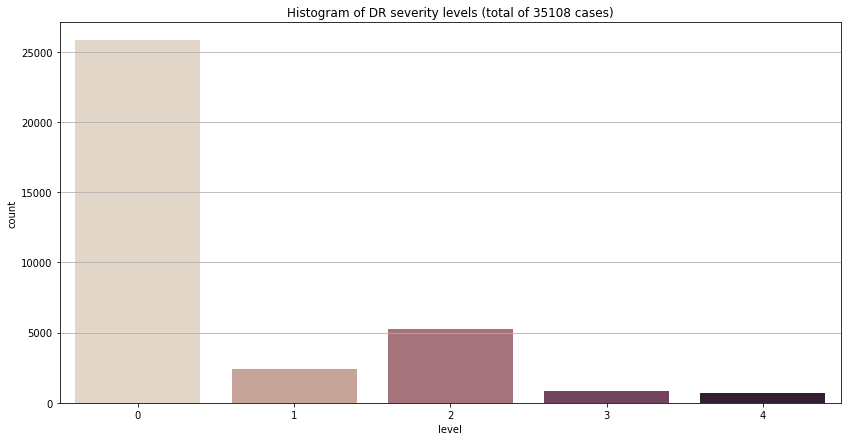

In [14]:
fig, ax = plt.subplots(figsize=(14,7))
plt.title(f'Histogram of DR severity levels (total of {train_df.count()[0]} cases)')
plt.grid(True)
sns.countplot(x='level', palette="ch:.25", data=train_df, ax=ax)


It seems that we posses many cases of healty eye images, but we don't posses alot of unhealthy specimens

Let's take a look at the images height and width dimensions distributions to make sure whether they are consistent in the dataset.<br />
Create a simple iterator for the dataset, in order to iterate over all the images in the directory

Let's add two additional columns of width, height to our dataframe for each opened image

In [15]:
train_df['width'] = 0
train_df['height'] = 0
train_df.head(7)

,image,level,width,height
0,10_left,0,0,0
1,10_right,0,0,0
2,13_left,0,0,0
3,13_right,0,0,0
4,15_left,1,0,0
5,15_right,2,0,0
6,16_left,4,0,0


In [12]:
from PIL import Image

def collect_dim_of_images(dir_path: str):
    for i, img_path in enumerate(train_df['image']):
        with Image.open(dir_path + '/' + img_path + '.jpeg') as img:
            train_df.loc[i,'width'] = img.size[0]   # width  (in pixels)
            train_df.loc[i,'height'] = img.size[1]  # height (in pixels)


In [32]:
collect_dim_of_images(TRAIN_IMAGES_PATH)

In [33]:
train_df

,image,level,width,height
0,10_left,0,1024,1024
1,10_right,0,1024,1024
2,13_left,0,1024,954
3,13_right,0,1024,954
4,15_left,1,1024,1023
...,...,...,...,...
35103,44347_right,0,1024,1024
35104,44348_left,0,1024,840
35105,44348_right,0,1024,841
35106,44349_left,0,1024,799


Now let's plot the distributions of width and height

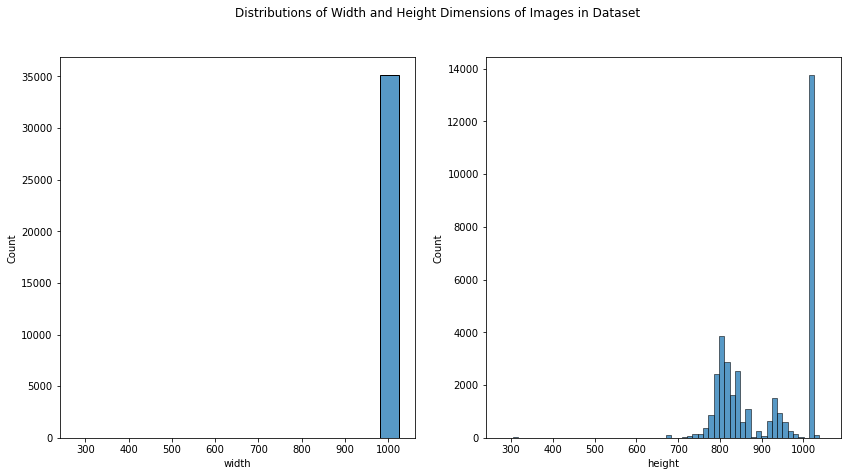

In [34]:
fig, axis = plt.subplots(1, 2, figsize=(14,7))
fig.suptitle('Distributions of Width and Height Dimensions of Images in Dataset')
sns.histplot(train_df['width'],  ax=axis[0])
sns.histplot(train_df['height'], ax=axis[1])


We may see that the width is consistent but the height isn't.<br /> We'll have to make sure to resize the height to a fixed value prior to attempting any neural network procedures. (Resize to 1024).<br />
An additional concern of mine is that the images are quite large.<br /> 1024x1024 features/pixels may turn out to be computationaly "difficult" to some extent for our future model.

In [16]:
import cv2
cv2.__version__

'4.1.2'

In [36]:
def resize(img, target_width: int, target_height: int):
    return cv2.resize(img, (target_width, target_height))

Let's see how the resize function works on some images

Text(0.5, 1.0, 'Resized: (1024, 1024, 3)')

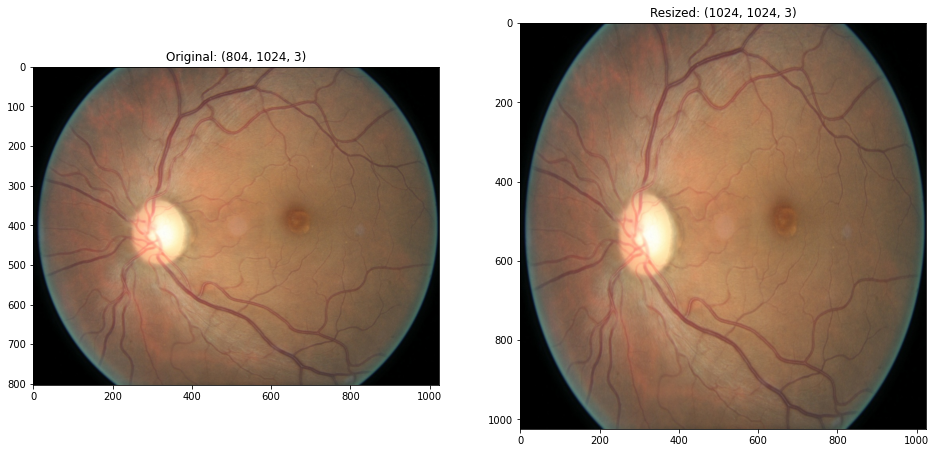

In [37]:
# original image
fig, axis = plt.subplots(1, 2, figsize=(16,16))

img = cv2.imread(TRAIN_IMAGES_PATH + '/410_right.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    # preserve the original color

resized = resize(img, 1024, 1024)


axis[0].imshow(img)
axis[1].imshow(resized)
axis[0].set_title(f'Original: {img.shape}')
axis[1].set_title(f'Resized: {resized.shape}')


We are not interested in streching the image till it reaches the target size, as seen above.<br /> The image aspect ratio is no longer kept.<br /> Thus, We need to find a way to pad with black pixels.

In [32]:
def resize_and_pad(img, target_size: int):
    """
    Accepts an image and resizes it to a (n x n) squared image with the given size
    in pixels.
    Preserves the aspect ratio, by padding with border color if needed.
    """
    old_size = img.shape[:2]  # old_size is in (height, width) format

    if old_size[0] == target_size and old_size[1] == target_size:
        return img
    
    ratio = float(target_size) / max(old_size)  
    new_size = tuple([int(x * ratio) for x in old_size])  # new_size should be in (width, height) format
    img = cv2.resize(img, (new_size[1], new_size[0]))

    delta_w = target_size - new_size[1]
    delta_h = target_size - new_size[0]
    top, bottom = delta_h // 2, delta_h - (delta_h // 2)
    left, right = delta_w // 2, delta_w - (delta_w // 2)
    
    return cv2.copyMakeBorder(img, 
                              top, bottom,
                              left,right,
                              cv2.BORDER_CONSTANT,
                              value=[0,0,0])  # color
                              

Text(0.5, 1.0, 'Resized: (1024, 1024, 3)')

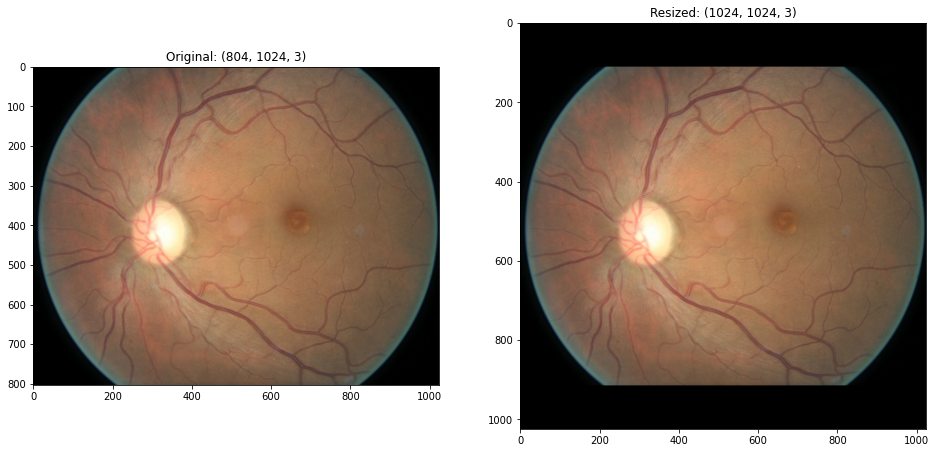

In [18]:
# original image
fig, axis = plt.subplots(1, 2, figsize=(16,16))

img = cv2.imread(TRAIN_IMAGES_PATH + '/410_right.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    # preserve the original color

resized = resize_and_pad(img, 1024)


axis[0].imshow(img)
axis[1].imshow(resized)
axis[0].set_title(f'Original: {img.shape}')
axis[1].set_title(f'Resized: {resized.shape}')


Now that's the form of images we want to work with. <br /> The aspect ratio is preserved and the additional padding needed was applied succesfully.

# Finding DR related features

Let us now attempt to answer the question: What makes an eye image to be classified with DR severity level greater than 0 ? <br />
We need to evaluate some of the pathological signs caused as a result of the disease. <br />
I will manually pick three "good" images with the following levels: Healthy (0), Moderate (2), and Severe (4).<br />
The difference between each pair of levels is equal on the level scale.<br />
Let us try to distinguish between the three cases in order to get some ideas on what features correspond to each case, and hopefully get some expectations later on.

## What are we looking for ?

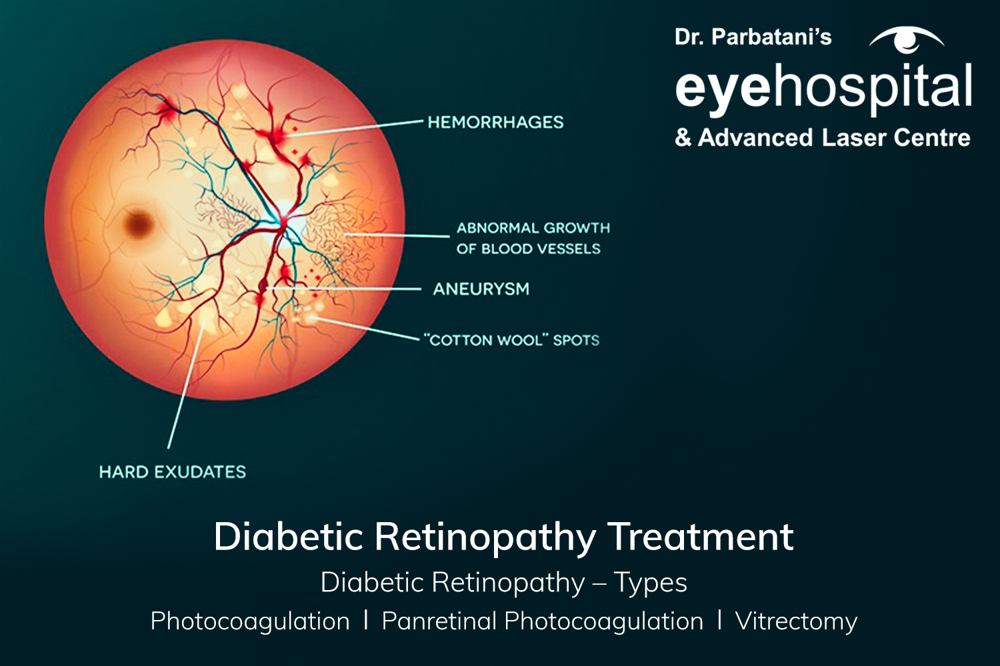

Picture source: http://dpeh.in/diabetic-retinopathy-treatment/




## Healthy Level 0 examples:

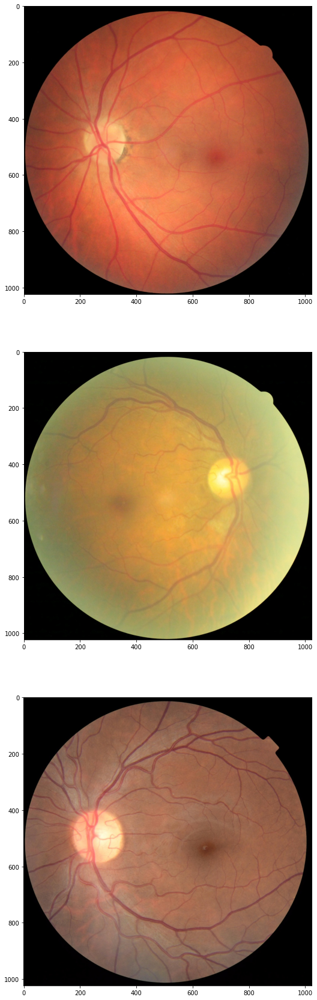

In [40]:
fig, axis = plt.subplots(3, 1, figsize=(30,30))

for i, filename in enumerate(['/706_left.jpeg', '/698_right.jpeg', '/966_left.jpeg']):
    img = cv2.imread(TRAIN_IMAGES_PATH + filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axis[i].imshow(img)

Healthy sample overall. Maybe there is some negligible signs of DR, but it maybe the poor quality of the picture. Our model will have to deal with these poor conditions later on.

## Moderate Level 2 examples:

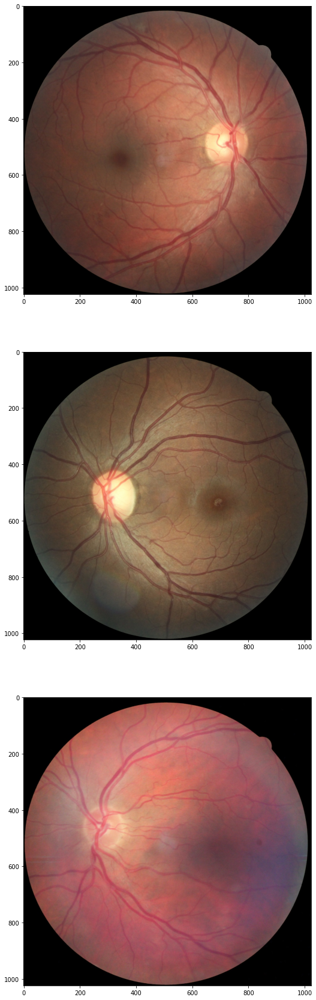

In [41]:
fig, axis = plt.subplots(3, 1, figsize=(30,30))

for i, filename in enumerate(['/129_right.jpeg', '/715_left.jpeg', '/829_left.jpeg']):
    img = cv2.imread(TRAIN_IMAGES_PATH + filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axis[i].imshow(img)

You may see some signs of DR:
- Abnormal growth of blood vessels (in the last picture)
- Small and thin developing Hard exudates or Cotton wool spots

## Severe Level 4 examples:

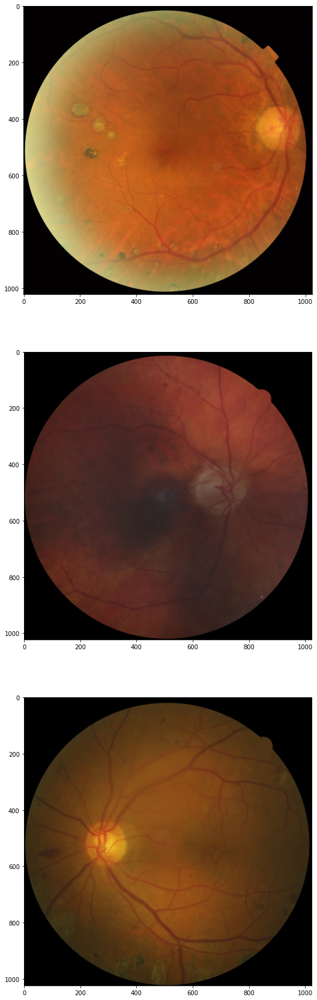

In [42]:
fig, axis = plt.subplots(3, 1, figsize=(30,30))

for i, filename in enumerate(['/217_right.jpeg', '/936_right.jpeg', '/23403_left.jpeg']):
    img = cv2.imread(TRAIN_IMAGES_PATH + filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axis[i].imshow(img)

We may observe clearly that the eye suffers from several signs of DR:
- Aneurysm in some places
- Cotton wool spots
- Hard exudates

Some images are darker than the others, some are brighter, some are cropped, and some have poor detail resolution.<br />
We need to be able to discover features that are not profoundly affected by the above disturbances.

# Some Image Processing

### Attempt 1: Improve brightness conditions with gray scale and contrast enhancment

In [19]:
# 23403_left.jpeg level 4 severe case
img = cv2.imread(TRAIN_IMAGES_PATH + '/23403_left.jpeg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

Text(0.5, 1.0, 'Original Gray Image')

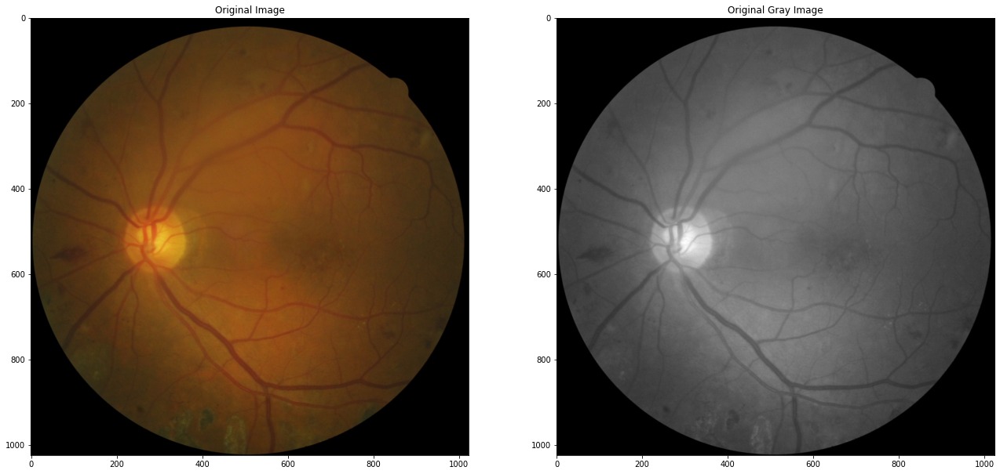

In [44]:
fig, axis = plt.subplots(1, 2, figsize=(22, 22))

axis[0].imshow(img)
axis[1].imshow(gray_img, cmap='gray')

axis[0].set_title('Original Image')
axis[1].set_title('Original Gray Image')

This is an original level 4 image vs original gray scaled.<br />
You can see at the bottom of the image that the eye has some cotton wool spots or hard exudates. The gray scale made a bit clearer.<br />
Let's try to make it even more distinguishable.

In [45]:
def change_lightning(img, alpha: float, beta: int):
    """
    alpha: [1.0-3.0] float  - Simple contrast control
    beta:  [0-100] int - Simple brightness control

    Do the operation new_image(i,j) = alpha*image(i,j) + beta
    Instead of these 'for' loops we could have used simply:
    new_image = cv.convertScaleAbs(image, alpha=alpha, beta=beta)
    but we wanted to show you how to access the pixels :)

    Notice: This function is very 
    """
    new_image = np.zeros(img.shape, img.dtype)
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            for c in range(img.shape[2]):
                new_image[y, x, c] = np.clip(alpha * img[y, x, c] + beta, 0, 255)
    return new_image



Text(0.5, 1.0, 'After Contrast and Brightness Change')

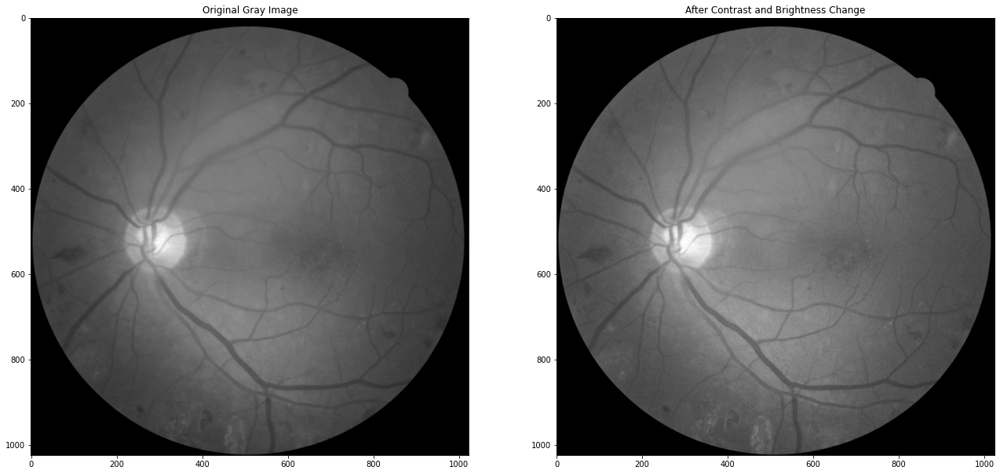

In [46]:
fig, axis = plt.subplots(1, 2, figsize=(22, 22))

new_img = change_lightning(img=img, alpha=1.2, beta=60)  # this function takes way too long
new_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)

axis[0].imshow(gray_img, cmap='gray')
axis[1].imshow(new_img, cmap='gray')

axis[0].set_title('Original Gray Image')
axis[1].set_title('After Contrast and Brightness Change')

Overall improvement. But the function is not optimized and takes way too long for such an improvement.<br />
Also consider that we have 35K images to process.
I also tried to tweak with the α and β parameters but did not get any significantly better results.<br />
Let's search the internet for something alternative and better.

### Attempt 2: addWeighted method of OpenCV

Use the cv2.addWeighted(source1, alpha, source2, beta, gamma[, dst[, dtype]])<br/>
It is a technique to blend two images togheter, where each image source has its corresponding weights.


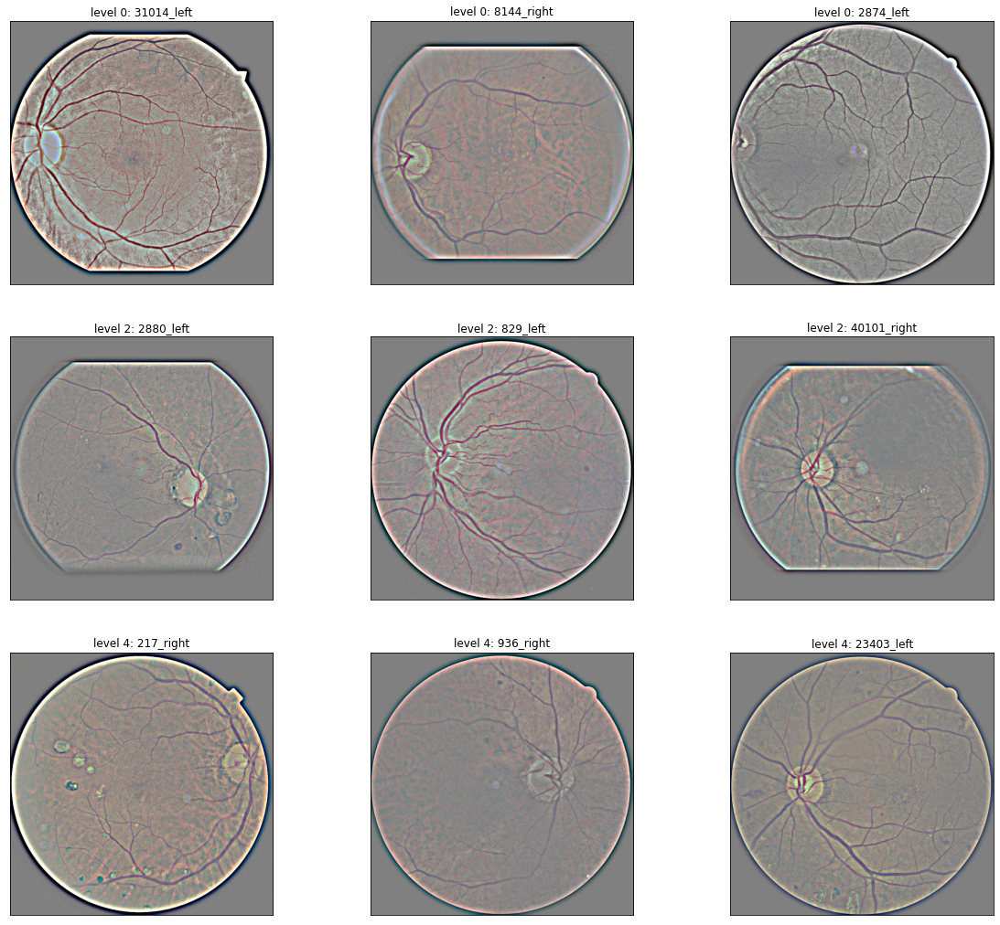

In [20]:

fig, axis = plt.subplots(3, 3, figsize=(20, 18))

images_list = [['31014_left', '8144_right', '2874_left'], # level 0
              ['2880_left', '829_left', '40101_right'],   # level 2
              ['217_right', '936_right', '23403_left']]   # level 4

for i, sublist in enumerate(images_list):
    for j, filename in enumerate(sublist):
        img = cv2.imread(TRAIN_IMAGES_PATH + '/' + filename + '.jpeg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = resize_and_pad(img, 1024)
        img = cv2.addWeighted(img, 4, cv2.GaussianBlur(img, (0, 0), 10), -4, 128)
        
        axis[i][j].imshow(img)
        axis[i][j].set_title(f'level {i*2}: {filename}')
        axis[i][j].set_xticks(())
        axis[i][j].set_yticks(())
        
        
    

Ok, now that's way better results relative to previous attempt.
We can observe better the severity differences between different cases.<br />
What's important is that the significant features of DR are enhanced.

Let's checkout how it look in gray scale:

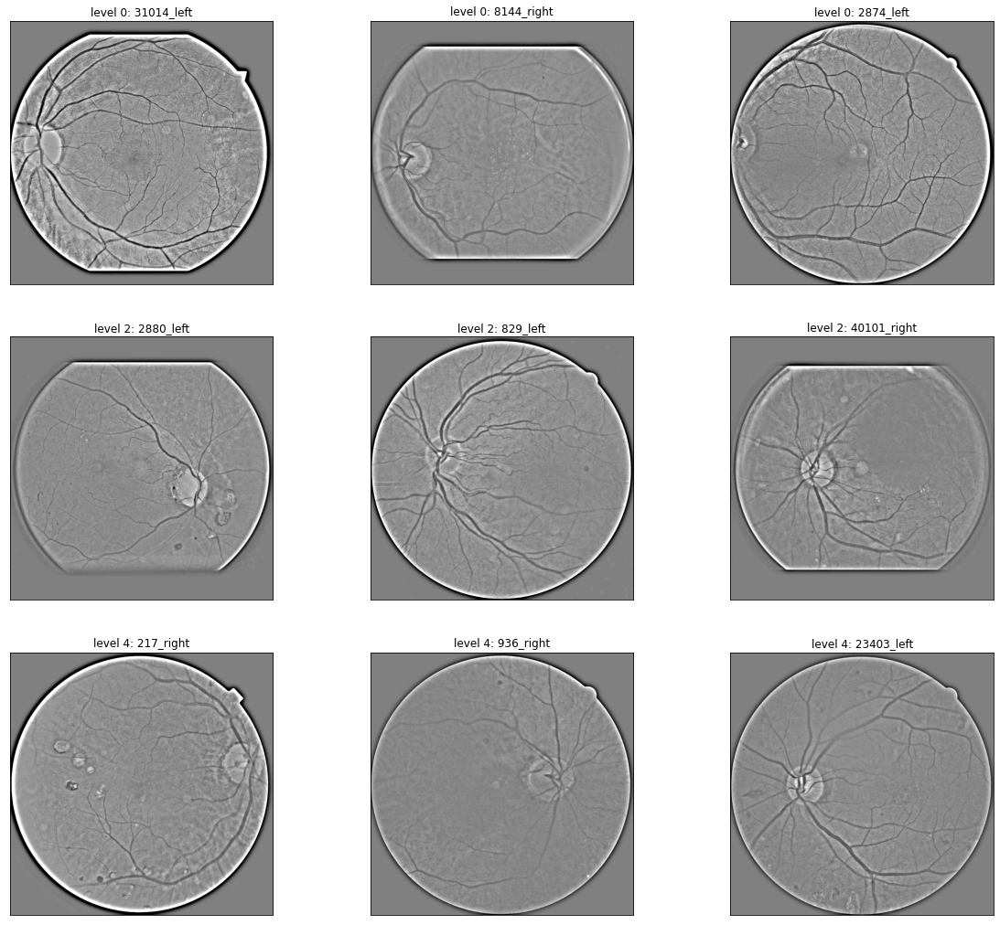

In [21]:
fig, axis = plt.subplots(3, 3, figsize=(20, 18))

for i, sublist in enumerate(images_list):
    for j, filename in enumerate(sublist):
        img = cv2.imread(TRAIN_IMAGES_PATH + '/' + filename + '.jpeg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = resize_and_pad(img, 1024)
        img = cv2.addWeighted(img, 4, cv2.GaussianBlur(img, (0, 0), 10), -4, 128)
        
        axis[i][j].imshow(img, cmap='gray')
        axis[i][j].set_title(f'level {i*2}: {filename}')
        axis[i][j].set_xticks(())
        axis[i][j].set_yticks(())

Let's see how a larger sigma affects the images. Let's change sigma from 10 to 30:

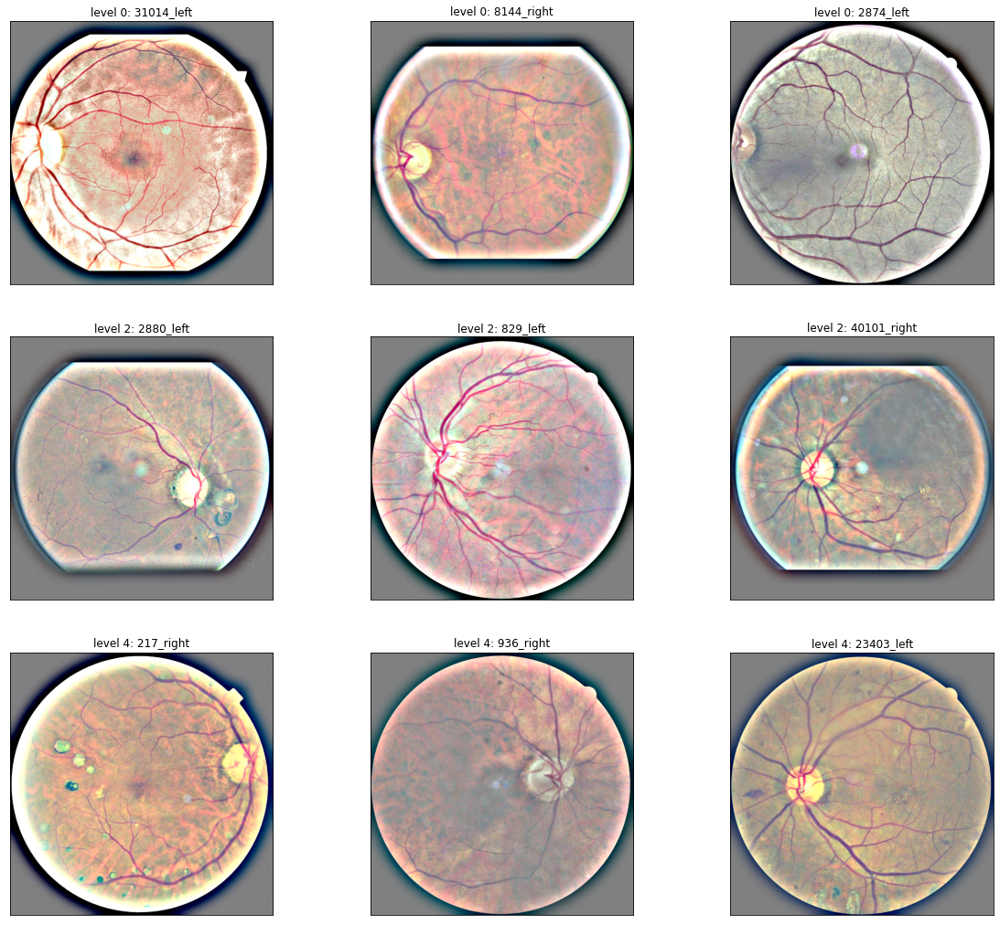

In [24]:
fig, axis = plt.subplots(3, 3, figsize=(20, 18))


for i, sublist in enumerate(images_list):
    for j, filename in enumerate(sublist):
        img = cv2.imread(TRAIN_IMAGES_PATH + '/' + filename + '.jpeg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = resize_and_pad(img, 1024)
        img = cv2.addWeighted(img, 4, cv2.GaussianBlur(img, (0, 0), 30), -4, 128)
        
        axis[i][j].imshow(img)
        axis[i][j].set_title(f'level {i*2}: {filename}')
        axis[i][j].set_xticks(())
        axis[i][j].set_yticks(())

Some details are more emphasized, but on the other hand, some images suffer from a "white ring" near the edges of the circumference.

### Attempt 3: cv2.detailEnhance and cv2.edgePreservingFilter.
Another technique to to check out

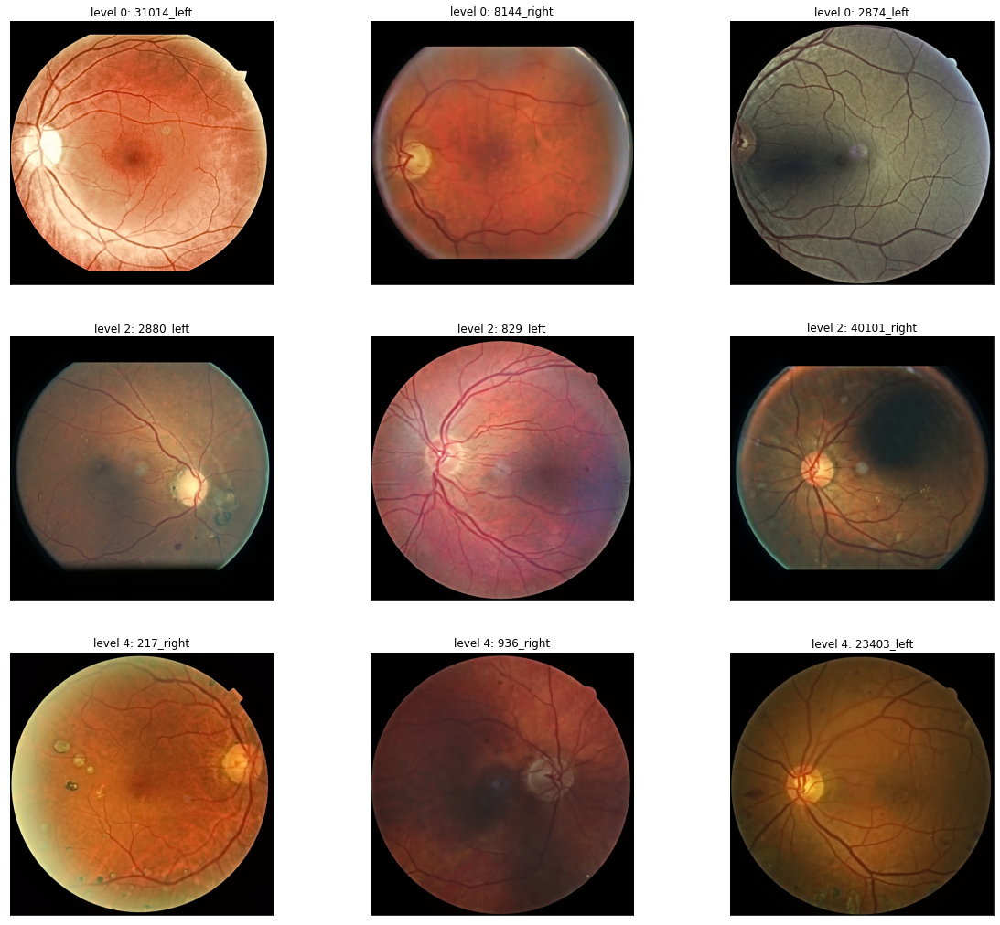

In [26]:
fig, axis = plt.subplots(3, 3, figsize=(20, 18))

for i, sublist in enumerate(images_list):
    for j, filename in enumerate(sublist):
        img = cv2.imread(TRAIN_IMAGES_PATH + '/' + filename + '.jpeg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = resize_and_pad(img, 1024)
        img = cv2.detailEnhance(img, sigma_s=10, sigma_r=0.15)
        img = cv2.edgePreservingFilter(img, flags=1, sigma_s=64, sigma_r=0.2)
        
        axis[i][j].imshow(img)
        axis[i][j].set_title(f'level {i*2}: {filename}')
        axis[i][j].set_xticks(())
        axis[i][j].set_yticks(())

The results look satisfying in some images, but I think this technique is less better than the one above with the addWeighted function.

# Prepare Train and Validation Datasets
Before starting to program any algorithm, we need to split our data into train and validation sets, to test all the future algorithms on the same set.<br />



In [51]:
# make a copy
# ! mkdir /content/resized_train_full

In [52]:
# ! cp -R /content/resized_train_cropped /content/resized_train_full

In [53]:
# PATH_TRAIN = '/content/resized_train_full'

### Resize all images to fixed dimensions: 1024 x 1024

In [27]:
IMAGE_SIZE = 1024  # for squared images: (IMAGE_SIZE x IMAGE_SIZE)

In [28]:
def resize_all(dir_path: str, target_size: int, to_gray=False):
    """
    Resize all images within the directory provided by dir_path.
    All images will be resized to consistent size: (target_size x target_size)
    The resulting images will replace the old ones.
    """
    for filename in os.listdir(dir_path):
        img = cv2.imread(dir_path + '/' + filename)
        if to_gray:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if not cv2.imwrite(dir_path + '/' + filename, resize_and_pad(img, IMAGE_SIZE)):
            raise IOError('Error writing resized image')


In [29]:
resize_all(TRAIN_IMAGES_PATH, IMAGE_SIZE)  # this takes a while

Check that we indeed resized all images:

In [58]:
counter = 0

for filename in os.listdir(TRAIN_IMAGES_PATH):
        img = cv2.imread(TRAIN_IMAGES_PATH + '/' + filename)
        if img.shape[:2][0] == IMAGE_SIZE and img.shape[:2][1] == IMAGE_SIZE:
            counter += 1

assert counter == len(os.listdir(TRAIN_IMAGES_PATH))
print(counter)

We may now drop the width, height columns from our dataframe. We won't use them.

In [30]:
train_df.drop(['width', 'height'], axis=1, inplace=True)

# First Attempt to classify DR condition to severity level using Sklearn

In [82]:
import sklearn
from sklearn.model_selection import train_test_split

The whole resized dataset cannot fit into memory,<br />
so we'll have to program a batch generator that will provide batches of <br /> of our dataset: images, labels.
Each generated batch must align with the requirements of sklearn modules.

The following class will be useful for us when implementing the training with the batch generator.<br />
It provides a convinient way to access image and its label.<br />
Notice that we apply a transformation on the image upon accessing it.

In [124]:
class DRImagesDataSet:
    def __init__(self, path, df):
        """
        path: path to dataset directory - images
        df: pandas dataframe that represents image name -> label entries
        """
        self.path = path
        self.df = df
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, name: str):
        """
        find the image name in the dataframe to get the label,
        then load the image and apply these transformations:
        - convert to grayscale color
        - change lightning conditions (presented in the cells above)
        finally return the pair.
        
        Notice: all images are assumed to be te same size of (IMAGE_SIZE x IMAGE_SIZE)
        """
        label = self.df.loc[self.df.image == name, 'level'].values[0]
        image = cv2.imread(TRAIN_IMAGES_PATH + '/' + name + '.jpeg')
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), 10), -4, 128)
        return image, label
    
    def train_validation_split(self, n, split_ratio, seed=None):
        """
        Takes the number of elements/entries in the dataset (size of df usually)
        and returns two lists of indices:
        train list is about n * split_ration elements
        validation list is about n * (1-split_ratio) elements
        """
        assert 0 <= split_ratio and split_ratio <= 1
        if seed is not None:
            np.random.seed(seed)
        
        l = list(range(n))
        np.random.shuffle(l)
        split_point = int(np.floor(len(l) * split_ratio))
        train = l[: split_point]
        valid = l[split_point: ]
        print(f'train: {len(train)}, validation: {len(valid)}')
        return train, valid

Integer divisors of 35108 are: 2, 4, 67, 131, 134, 262, 268, 524, 8777, 17554

In [131]:
BATCH_SIZE = 262
SLICE_SIZE = 10
NUM_CLASSES = 5
SPLIT_RATIO = 0.7

Some tools for batch processing in sklearn

In [132]:
from itertools import chain, islice


def train(classifier, dataset, train_names, batch_size=BATCH_SIZE):
    """
    -> Read only part of the data
    -> Partial train the classifier
    -> delete the data
    -> read other part of the data
    -> continue to train the classifier.

    classifier: the chosen classifier of our network. must support partial_fit method
    dataset: generator of fixed size batches of the dataset
    """
    iterator = image_vectors_1d_and_label(dataset, train_names)

    for batch in gen_batches(iterator, BATCH_SIZE):
        image_batch, label_batch = zip(*batch)
        label_batch = list(label_batch)
        
        classifier.partial_fit(image_batch, pd.Series(label_batch), classes=[0 ,1, 2, 3, 4])
        print('.', end='')
    return classifier


def image_vectors_1d_and_label(dataset, filenames):
    """
    gnerator that converts 2D images to 1D vectors and yields them with their
    appropriate label
    """
    for name in filenames:
        image, label = dataset[name]
        yield image.flatten(), label


def gen_batches(iterable, size=SLICE_SIZE):
    iterator = iter(iterable)
    for first in iterator:
        yield chain([first], islice(iterator, size - 1))

Define our resized images dataset for sklearn:

In [126]:
dataset = DRImagesDataSet(TRAIN_IMAGES_PATH, train_df)

Perform a split to get training indices and validtion indices:

In [133]:
train_indices, validation_indices = dataset.train_validation_split(n=len(dataset),
                                                                   split_ratio=SPLIT_RATIO,
                                                                   seed=42)

train: 24575, validation: 10533


In [134]:
train_df.iloc[train_indices, :].values

array([['17340_right', 0],
       ['27852_right', 0],
       ['34901_left', 4],
       ...,
       ['4184_left', 0],
       ['24305_right', 0],
       ['19876_right', 0]], dtype=object)

Prepare the train_names for the train function, and validation_names for accuracy estimation later on.

In [135]:
train_names = train_df.iloc[train_indices, :].values[:,0]
train_names = train_names.astype(str)

In [91]:
validation_names = train_df.iloc[validation_indices, :].values[:,0]
validation_names = validation_names.astype(str)

### Let's train the classifier that we have selected

In [85]:
from sklearn.naive_bayes import MultinomialNB

I chose Multinomial Naive Bayes classifier according to "Choosing the right estimator" guideline in skleran website:<br />
https://scikit-learn.org/stable/tutorial/machine_learning_map/index.html

In [136]:
classifier = MultinomialNB()
classifier = train(classifier, dataset, train_names, batch_size=BATCH_SIZE)

..............................................................................................

### We'll be using 3 tools to evaluate our models:

* Precision Accuracy - For a rough & simple evaluation of our model
* Quadratic weighted kappa (qwk) - This function computes Cohen’s kappa, a score that expresses the level of agreement between two annotators on a classification problem.
* Confusion matrix - To visualize where our model struggles the most

In [138]:
from sklearn.metrics import cohen_kappa_score, precision_score, confusion_matrix

In [168]:
def get_true_labels_and_predicted_labels(classifier, batch_iter, batch_size):
    """
    Let the model predict the images.
    Return the true labels list and their corresponding prediceted labels
    """
    predictions = []
    true_labels = []
    
    for batch in gen_batches(batch_iter, batch_size):
        image_batch, label_batch = zip(*batch)
        prediction = classifier.predict(image_batch)
        predictions = np.concatenate([predictions, prediction])
        true_labels = np.concatenate([true_labels, label_batch])
        
        print('.', end='')
    return true_labels, predictions



def draw_confusion_matrix(correct_labels, predictions, num_categories):
    cf_matrix  = confusion_matrix(correct_labels, predictions, labels=range(num_categories))
    
    df_cm = pd.DataFrame(cf_matrix, range(num_categories), range(num_categories))

    plt.figure(figsize=(12,9))
    ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')
    ax.set_title('Naive Bayes Confusion Matrix of Diabetic Retinopathy Images\n')
    ax.set_xlabel('\nPredicted DR Category')
    ax.set_ylabel('Actual DR Category\n')
    ax.xaxis.set_ticklabels(['Healthy','Mild', 'Moderate', 'Proliferative', 'Severe'])
    ax.yaxis.set_ticklabels(['Healthy','Mild', 'Moderate', 'Proliferative', 'Severe'])
    plt.show()



### Attempt to predict on validation set

In [143]:
true_labels, predicted_labels = get_true_labels_and_predicted_labels(classifier, 
                                                                    image_vectors_1d_and_label(dataset,
                                                                                               validation_names), 
                                                                    BATCH_SIZE)


.........................................

In [145]:
precision = precision_score(true_labels, predicted_labels, average='macro')
print(f'The "precision score" of our prediction: {precision}')

The "precision score" of our prediction: 0.21683143865382334


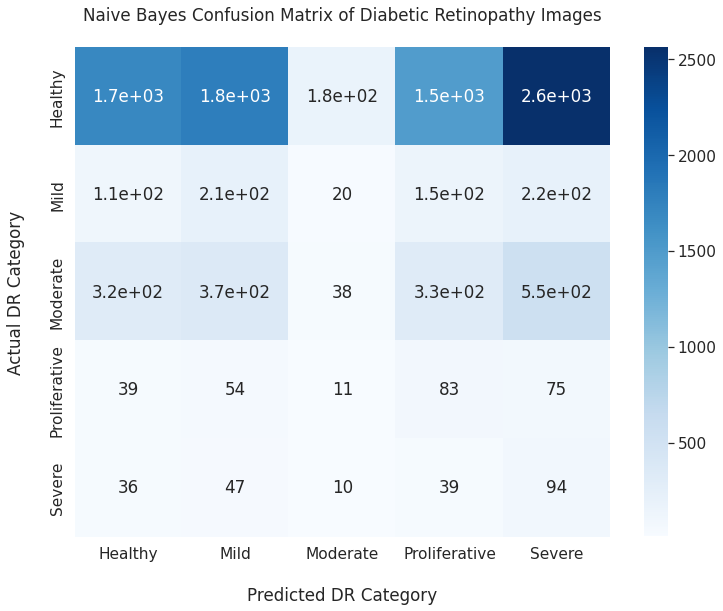

In [159]:
draw_confusion_matrix(true, predicted, NUM_CLASSES)

In [181]:
validation_df = train_df[np.isin(train_df, [validation_names]).any(axis=1)]
print('Validation set stats:')
print('Healthy: ' + str(validation_df['level'].value_counts()[0]))
print('Mild: ' + str(validation_df['level'].value_counts()[1]))
print('Moderate: ' + str(validation_df['level'].value_counts()[2]))
print('Proliferative: ' + str(validation_df['level'].value_counts()[3]))
print('Severe: ' + str(validation_df['level'].value_counts()[4]))
len(validation_df)

Validation set stats:
Healthy: 7727
Mild: 713
Moderate: 1605
Proliferative: 262
Severe: 226


10533

We can see that out of roughly 7000 healthy samples, our model prediced correcty only about 1700.<br />Even worse - it predicted about 2600 healthy samples as severe.<br />In between, it did a poor job predicting other cases.


In [155]:
qwk_score = cohen_kappa_score(true_labels, predicted_labels, weights="quadratic")
print(f'Quadratic Weighted Kappa test score: {qwk_score}')

Quadratic Weighted Kappa test score: 0.023386472693865845


Kappa or Cohen’s Kappa is like classification accuracy, except that it is normalized at the baseline of random chance on your dataset: It basically tells you how much better your classifier is performing over the performance of a classifier that simply guesses at random according to the frequency of each class.

Quadratic Weighted Kappa test score: 0.0233 indicates that our naive bayes model performs as if it guessed poorly.

The precision score of 0.216 does not look promising either.<br />

Let's try a more modern approach, using a CNN based techniques with keras and TensorFlow.

# CNN with Keras

In [ ]:
# import tensorflow as tf
# from tensorflow import keras
# print(keras.__version__, np.__version__, tf.__version__)

In [65]:
# # training set
# train_ds = keras.utils.image_dataset_from_directory(
#     directory=PATH,
#     labels='inferred',
#     label_mode='int',
#     class_names=None,
#     color_mode='rgb',
#     batch_size=BATCH_SIZE,
#     shuffle=True,
#     seed=42,
#     validation_split=0.3,
#     subset='training',
#     follow_links=False,
#     crop_to_aspect_ratio=False,
#     image_size=(IMAGE_SIZE, IMAGE_SIZE)
# )

In [66]:
# # validation
# val_ds = keras.utils.image_dataset_from_directory(
#     directory=PATH,
#     labels='inferred',
#     label_mode='categorical',
#     class_names=None,
#     color_mode='rgb',
#     batch_size=BATCH_SIZE,
#     shuffle=True,
#     seed=42,
#     validation_split=0.3,
#     subset='validation',
#     follow_links=False,
#     crop_to_aspect_ratio=False,
#     image_size=(IMAGE_SIZE, IMAGE_SIZE)
# )